In [1]:
using Plots, LinearAlgebra, LaTeXStrings, DifferentialEquations, BenchmarkTools
const G = 6.67430e-11;  # Gravitational constant (m^3 kg^-1 s^-2)
const Mₑ = 5.972e24;     # mass of Earth
const Mₘ = 0.330e24;     # mass of mercury
const AU = 1.496e11;    # astronomical unit
const Mₛ = 1.989e30;    # mass sun
mutable struct Planet
    m::Float64
    r::Vector{Float64}
    v::Vector{Float64}
    a::Vector{Float64}
end
sun = Planet(1.989e30, [0.0, 0.0], [0.0, 0.0], [0.0, 0.0]);
mercury = Planet(0.330e24, [46.0e9, 0.0], [0.0, 58.97e3], [0.0, 0.0]);
venus = Planet(4.867e24, [107.48e9, 0.0], [0.0, 35.26e3], [0.0, 0.0]);
earth = Planet(5.972e24, [1.47095e11, 0.0], [0.0, 30.29e3], [0.0, 0.0] ); 
mars = Planet(6.39e23, [206.65e9, 0.0], [0.0, 26.5e3], [0.0, 0.0]);
jupiter = Planet(1898e24, [740.595e9, 0.0], [0.0, 13.72e3], [0.0, 0.0]);
saturn = Planet(568e24, [1357.554e9, 0.0], [0.0, 10.14e3], [0.0, 0.0]);
uranus = Planet(86.8e24, [2732.696e9, 0.0], [0.0, 7.13e3], [0.0, 0.0]);
neptune = Planet(102e24, [4471.050e9, 0.0], [0.0, 5.47e3], [0.0, 0.0]);
pluto = Planet(0.0130e24, [4434.987e9, 0.0], [0.0, 6.10e3], [0.0, 0.0]);
sun_EC = Planet(1.989e30, [0.0, 0.0], [0.0, 0.0], [0.0, 0.0]);

In [2]:

function accel(bodyi::Planet, bodyj::Planet)
    rij = bodyj.r .- bodyi.r
    r = norm(rij)
    aᵢ =  (G*bodyj.m/r^3)*rij
end


function simulate(bodies, num_steps, Δt)
    num_bodies = length(bodies)
    positions = [zeros(num_steps, 2) for _ in 1:num_bodies]                         # initialize position, velocity, and acceleration arrays to analyze for accuracy later
    velocities = [zeros(num_steps, 2) for _ in 1:num_bodies]
    accelerations = [zeros(num_steps, 2) for _ in 1:num_bodies]
    
    for i in 1:num_bodies    # initialize positions for all objects
        positions[i][1, :] = bodies[i].r
        velocities[i][1, :] = bodies[i].v
        accelerations[i][1, :] = bodies[i].a
    end

    for step = 2:num_steps
        for i in 1:num_bodies
            a_total = zeros(2)
            for j in 1:num_bodies
                if i != j
                    a = accel(bodies[i], bodies[j])
                        a_total = a_total + a
                end
            end
            bodies[i].v =  bodies[i].v .+ a_total * Δt  
            
            bodies[i].r = bodies[i].r .+ bodies[i].v * Δt 
           
            positions[i][step, :] = bodies[i].r 
            velocities[i][step, :] = bodies[i].v
            accelerations[i][step, :] = bodies[i].a

            end

    end

    return positions, velocities, accelerations
end  
## Setup and simulation run:
function change(Δt, n, bodies, return_plot::Bool=true)
bodies4 = bodies
    sun_EC.v = -(mercury.m*mercury.v+earth.v*earth.m)/sun_EC.m


num_steps = Int(86400*365*n/Δt)
# now run simulation
    
pos, vel, acc = simulate(bodies4, num_steps, Δt);


p1 = plot(pos[1][:, 1]/1.496e11, pos[1][ : ,2]/1.496e11, aspect_ratio=:equal, label="sun");
p2 =     plot!(pos[2][:, 1]/1.496e11, pos[2][ : ,2]/1.496e11, xlabel="x/Des}", ylabel="y/Des", label="mercury")
p3 =    plot!(pos[3][:, 1]/1.496e11, pos[3][ : ,2]/1.496e11, label="earth")

 
    plot1 = plot(p1, size=(1000, 1000), legend=:bottom)
    
       
    # Check if return_plot is set to true
    if return_plot
        # Generate the plot and return it
        return display(plot1)
    else
        # Perform necessary computations without generating the plot
        return pos, vel
    end

end


change (generic function with 2 methods)

In [3]:
change(3600, 1, [sun_EC, mercury, earth], false)

([[0.0 0.0; 0.3736443141316388 -362.6280180995475; … ; 5755.257927145646 -6844.047716260778; 5782.857109878027 -7183.642928153737], [4.6e10 0.0; 4.599918692693363e10 2.1229199999359035e8; … ; 1.1328224564414845e10 5.17634335631421e10; 1.115564999846525e10 5.183691278507198e10], [1.47095e11 0.0; 1.4709492048485785e11 1.0904399999986263e8; … ; 1.470940770429302e11 -5.808978658187544e8; 1.4709442112080457e11 -4.7185454144511735e8]], [[-0.0 -0.10073000502765209; 0.00010379008725878855 -0.10073000502765209; … ; 0.007594084999611025 -0.09435932813392543; 0.007666439647883465 -0.09433200330359975], [0.0 58970.0; -225.85362954645302 58969.999998219544; … ; -47900.991385381865 20577.167719447014; -47937.379430442845 20410.89498052433], [0.0 30290.0; -22.08753948563799 30289.99999996184; … ; 117.6644847566732 30289.72509951081; 95.57718731995801 30289.81232601031]])

### change EC function to have momentum of sun change with bodies

In [4]:
restart()

LoadError: UndefVarError: `restart` not defined

In [2]:
dt = 3600.0
function acceleration(r::Vector{T}, v::Vector{T}, M::T, G::T) where T<:Real
    r_mag = norm(r)
    a_mag = -G*M / r_mag^2
    a = a_mag * r / r_mag
    return a
end

function rk4_step(r::Vector{T}, v::Vector{T}, M::T, G::T, dt::T) where T<:Real
    k1_v = acceleration(r, v, M, G) * dt
    k1_r = v * dt

    k2_v = acceleration(r + k1_r/2, v + k1_v/2, M, G) * dt
    k2_r = (v + k1_v/2) * dt

    k3_v = acceleration(r + k2_r/2, v + k2_v/2, M, G) * dt
    k3_r = (v + k2_v/2) * dt

    k4_v = acceleration(r + k3_r, v + k3_v, M, G) * dt
    k4_r = (v + k3_v) * dt

    v += (k1_v + 2*k2_v + 2*k3_v + k4_v) / 6
    r += (k1_r + 2*k2_r + 2*k3_r + k4_r) / 6

    return r, v
end


rk4_step (generic function with 1 method)

In [5]:
function RK_sim(bodies,n)              # n = years, bodies = vector of planets
p = plot(size=(1000,1000))
for i in 1:length(bodies)
    
    r = bodies[i].r
    v = bodies[i].v
    t = 0.0
    
    orbit = [r]
    for j in 1:length(bodies)
        if i != j
    while t < 365.25*24*3600*n
        
        r, v = rk4_step(r, v, bodies[j].m, G, dt)
        t += dt
        push!(orbit, r)
    end
        end
    
    end
orbit = hcat(orbit...)
    
p = plot!(orbit[1,:]/1.496e11, orbit[2,:]/1.496e11,
     xlabel="x (m)", ylabel="y (m)", label=false,
     title="Orbit of Mercury and Earth around the Sun")
    
end
display(p)
end

RK_sim (generic function with 1 method)

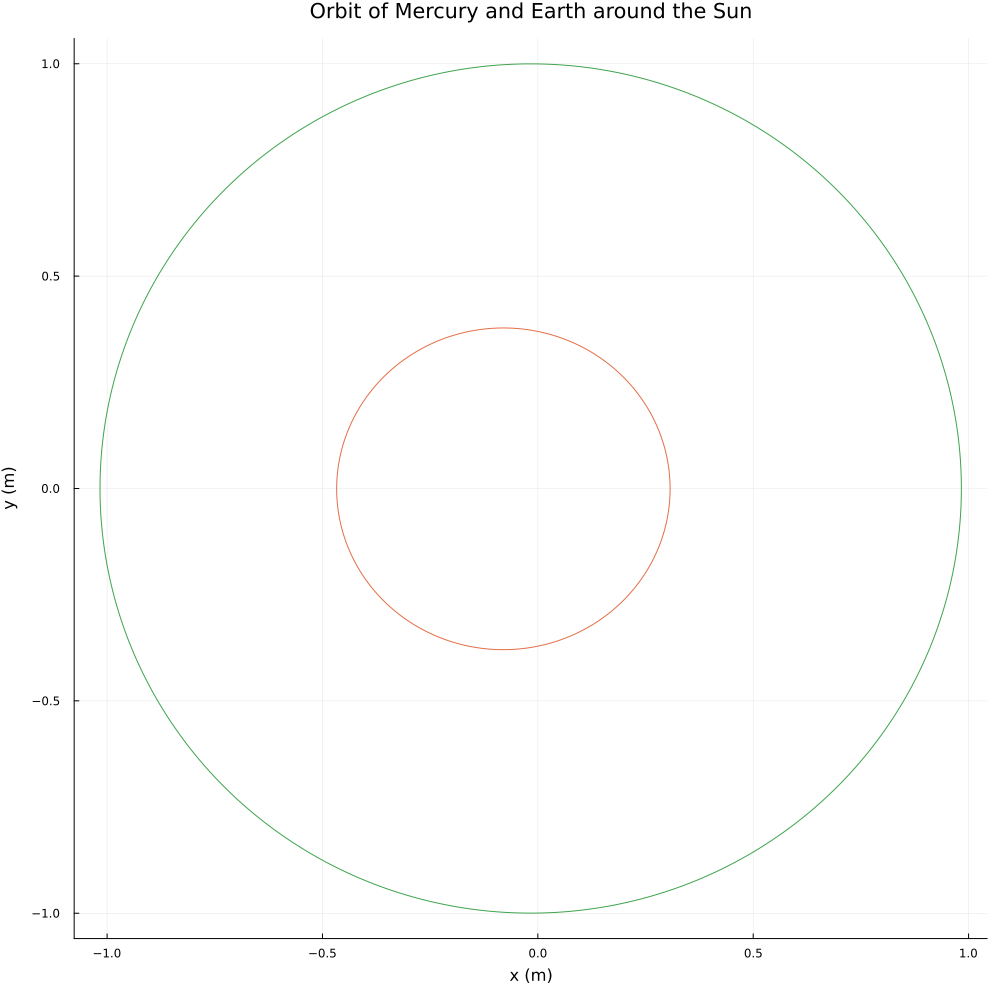

In [7]:
RK_sim([sun, mercury, earth], 10)

In [8]:
restart()

Planet(1.989e30, [0.0, 0.0], [0.0, 0.0], [0.0, 0.0])

In [126]:
function RK_sim(bodies, n, return_plot::Bool=true)
    p = plot(size=(1000,1000))
    orbit = []
    vel = []
    mer = []
    t_mer = []
    v_mer = []
    
for i in 1:length(bodies)
    
    r = bodies[i].r
    v = bodies[i].v
    t = 0.0
        
    
    orbit = [r]
    vel = [v]
    t_mer = [t] 
    v_mer = [v]
        
    for j in 1:length(bodies)
        if i != j
    while t < 365.25*24*3600*n
        
        r, v = rk4_step(r, v, bodies[j].m, G, dt)
        t += dt
        push!(orbit, r)
        push!(vel, v)
        push!(t_mer, t)
        push!(v_mer, v)
    end
        end
    
    end
orbit = hcat(orbit...)
vel = hcat(vel...)
t_mer = hcat(t_mer...)
v_mer = hcat(v_mer...)
    
p = plot!(orbit[1,:]/1.496e11, orbit[2,:]/1.496e11,
     xlabel="x (m)", ylabel="y (m)", label=false,
     title="Orbit of Mercury and Earth around the Sun")
        if return_plot
        # Generate the plot and return it
        display(p)
    elseif i == 2
            mer = orbit
            t_mer = t_mer
            v_mer = v_mer
        
        # Perform necessary computations without generating the plot
        return orbit, mer, v_mer, vel, t_mer
    
    end
        
    end
    # Check if return_plot is set to true
    
end

RK_sim (generic function with 2 methods)

In [127]:
p, merc, v_mer, v, t= RK_sim([sun, mercury, venus, earth, mars, jupiter, saturn, uranus, jupiter], 1, false)
result = t
v_mer

2×8767 Matrix{Float64}:
     0.0   -225.853   -451.699   -677.532  …  -47992.8  -48025.4  -48057.4
 58970.0  58969.5    58967.9    58965.3        19606.2   19441.2   19276.4

In [11]:
restart()

Planet(1.989e30, [0.0, 0.0], [0.0, 0.0], [0.0, 0.0])

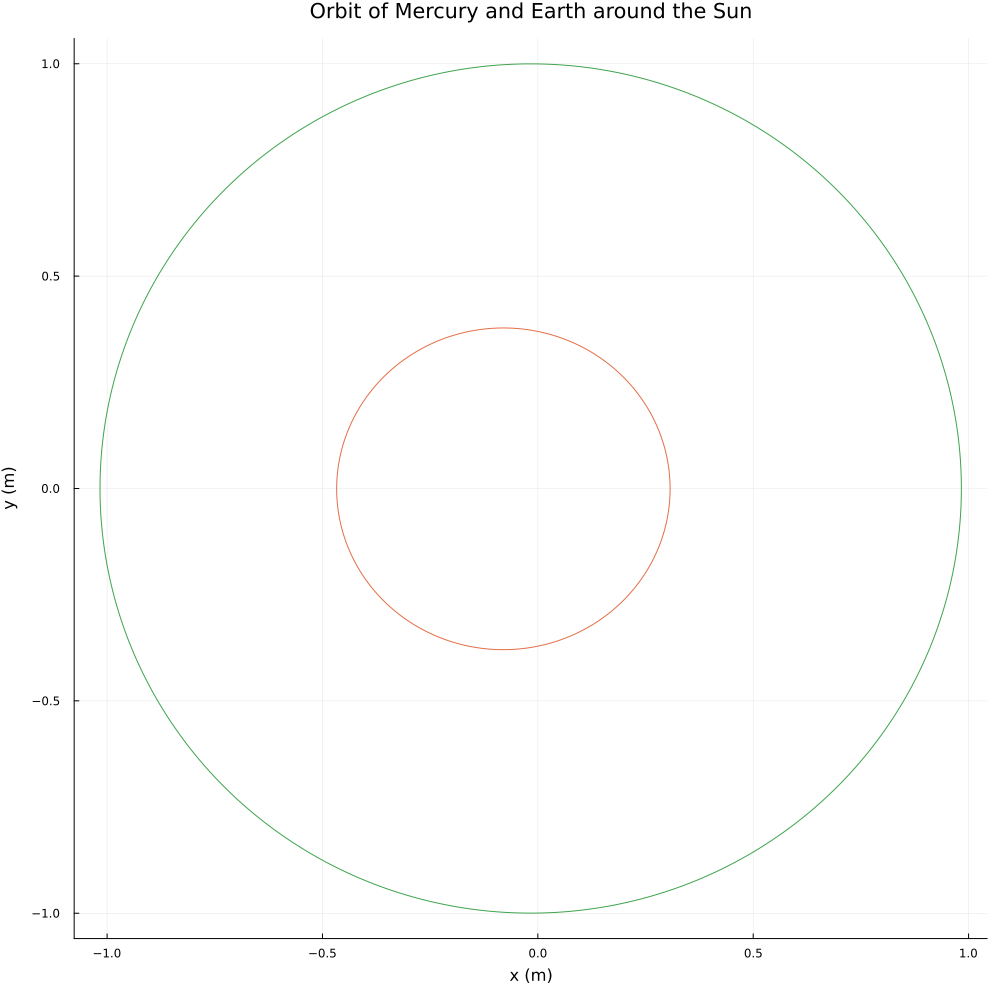

In [12]:
RK_sim([sun, mercury, earth], 10, true)

In [11]:
@benchmark RK_sim([sun, mercury, earth], 5, false)

BenchmarkTools.Trial: 14 samples with 1 evaluation.
 Range (min … max):  222.945 ms … 437.949 ms  ┊ GC (min … max): 38.59% … 50.46%
 Time  (median):     380.802 ms               ┊ GC (median):    47.16%
 Time  (mean ± σ):   360.310 ms ±  64.890 ms  ┊ GC (mean ± σ):  47.42% ±  3.65%

  ▁         ▁          ▁    ▁      ▁       ▁ ▁  ▁█   ▁    ▁ ▁ ▁  
  █▁▁▁▁▁▁▁▁▁█▁▁▁▁▁▁▁▁▁▁█▁▁▁▁█▁▁▁▁▁▁█▁▁▁▁▁▁▁█▁█▁▁██▁▁▁█▁▁▁▁█▁█▁█ ▁
  223 ms           Histogram: frequency by time          438 ms <

 Memory estimate: 440.75 MiB, allocs estimate: 5795110.

In [12]:
@benchmark change(3600, 5, [sun_EC, mercury, earth], false)

BenchmarkTools.Trial: 115 samples with 1 evaluation.
 Range (min … max):  39.868 ms … 48.847 ms  ┊ GC (min … max): 16.30% … 26.36%
 Time  (median):     43.799 ms              ┊ GC (median):    22.13%
 Time  (mean ± σ):   43.775 ms ±  1.572 ms  ┊ GC (mean ± σ):  21.35% ±  2.37%

                                 ▁▂ █                          
  ▃▁▃▃▄▄▄▄▃▁▁▁▁▁▁▁▁▁▃▃▄▁▁▁▁▁▁▁▄▄▆██▄█▇▆▄▃▃▄▁▁▁▃▄▅▆▄▃▁▄▃▁▃▄▄▁▄ ▃
  39.9 ms         Histogram: frequency by time        46.6 ms <

 Memory estimate: 124.58 MiB, allocs estimate: 1454995.

Euler cromer is a lot quicker by 4 to 9 ish times. 

Alter both codes to also return velocities, accelerations, time for revolutions. 

### Accuracy

In [13]:
restart()

Planet(1.989e30, [0.0, 0.0], [0.0, 0.0], [0.0, 0.0])

In [14]:
p, v = RK_sim([sun, mercury, earth], 1, false)
p_revolution = p[end] - p[2]

2.9437108966441005e8

In [15]:
restart()

Planet(1.989e30, [0.0, 0.0], [0.0, 0.0], [0.0, 0.0])

In [16]:
pos, v = change(250, 1, [sun_EC, mercury, earth], false)
pos_revolution = pos[3][end] - pos[3][1,2]

-3.699277514276484e8

In [17]:
restart()

Planet(1.989e30, [0.0, 0.0], [0.0, 0.0], [0.0, 0.0])

In [18]:
p[end]

-1.774834517807073e8

In [19]:
restart()

Planet(1.989e30, [0.0, 0.0], [0.0, 0.0], [0.0, 0.0])

In [20]:
p[2]

-4.7185454144511735e8

In [21]:
restart()

Planet(1.989e30, [0.0, 0.0], [0.0, 0.0], [0.0, 0.0])

In [22]:
pos[3][1,2]

-4.7185454144511735e8

In [23]:
restart()

Planet(1.989e30, [0.0, 0.0], [0.0, 0.0], [0.0, 0.0])

In [24]:
pos[3][end]

-8.417822928727658e8

### Does sun EC need to be kept consistent. Does it change after every time change function occurs.

Precession of mercury. Calculate $\Delta \theta$ using the axis shifts.

In [19]:
@benchmark change(250, 5, [sun_EC, mercury, earth], false)

BenchmarkTools.Trial: 8 samples with 1 evaluation.
 Range (min … max):  582.490 ms … 730.639 ms  ┊ GC (min … max): 15.64% … 11.41%
 Time  (median):     728.631 ms               ┊ GC (median):    11.44%
 Time  (mean ± σ):   700.525 ms ±  52.595 ms  ┊ GC (mean ± σ):  12.06% ±  1.47%

                                                              █  
  ▅▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▅▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▅▁▁▁▁▁▁▁▁█ ▁
  582 ms           Histogram: frequency by time          731 ms <

 Memory estimate: 1.75 GiB, allocs estimate: 20823355.

When the $\Delta t$  of the Euler_Cromer method is decreased to match the level of accuracy of the Runge-Kutta method, the benchmark for Runge-Kutta outperforms the benchmark for Euler-Cromer.

Find the maximum and minimum of each revolution. Then, find the axis from those points. Then measure the change in $\Delta \theta$ and compare to the $\Delta \theta$ from NASA.

In [25]:
restart()

Planet(1.989e30, [0.0, 0.0], [0.0, 0.0], [0.0, 0.0])

In [8]:
sun = Planet(1.989e30, [0.0, 0.0], [0.0, 0.0], [0.0, 0.0]);
mercury = Planet(0.330e24, [46.0e9, 0.0], [0.0, 58.97e3], [0.0, 0.0]);
venus = Planet(4.867e24, [107.48e9, 0.0], [0.0, 35.26e3], [0.0, 0.0]);
earth = Planet(5.972e24, [1.47095e11, 0.0], [0.0, 30.29e3], [0.0, 0.0] ); 
mars = Planet(6.39e23, [206.65e9, 0.0], [0.0, 26.5e3], [0.0, 0.0]);
jupiter = Planet(1898e24, [740.595e9, 0.0], [0.0, 13.72e3], [0.0, 0.0]);
saturn = Planet(568e24, [1357.554e9, 0.0], [0.0, 10.14e3], [0.0, 0.0]);
uranus = Planet(86.8e24, [2732.696e9, 0.0], [0.0, 7.13e3], [0.0, 0.0]);
neptune = Planet(102e24, [4471.050e9, 0.0], [0.0, 5.47e3], [0.0, 0.0]);
pluto = Planet(0.0130e24, [4434.987e9, 0.0], [0.0, 6.10e3], [0.0, 0.0]);
sun_EC = Planet(1.989e30, [0.0, 0.0], [0.0, 0.0], [0.0, 0.0]);

In [146]:
p, merc, merc_v, v, t_mercury= RK_sim([sun, mercury, venus, earth, mars, jupiter, saturn, uranus, jupiter], 2, false)
result = [merc[1234], merc[1233]]
norm(result)
t_mercury
merc_v

2×17533 Matrix{Float64}:
     0.0   -225.853   -451.699   -677.532  …  -36044.0  -35965.9  -35887.6
 58970.0  58969.5    58967.9    58965.3       -23071.7  -23156.6  -23241.2

## the next two cells give me the positions of each revolution and min of each rev then norm and then going to find angle changes. can alter the code later to get the revolution positions and then take the last rev of every 250 years. then plot over one thousand of those or half that. 

In [319]:
 n = Int(round(100/0.241))

415

In [387]:
function minv(method, years)
    p, merc, merc_v, v, t_mercury = method
    s = []
    min = []
    n = Int(round(years/0.241))
    l = []
    f = []
    for j in 1:n
        for i in (2114*j-2113):2114*j
            if norm((merc_v[1,i], merc_v[2,i])) ≥ 58969.0 && norm((merc_v[1,i], merc_v[2,i])) ≤ 58971.0
            min = [merc[1,i], merc[2,i]]
            end
            s = min
            push!(l, s)
            
        end
        push!(f, l[end])                               # take last spot of rev
    end
    return f
end

minv (generic function with 2 methods)

In [389]:
perih = minv(RK_sim([sun, mercury, venus, earth, mars, jupiter, saturn, uranus, jupiter], 100, false), 99)

411-element Vector{Any}:
 [4.599696979370481e10, 5.795809672944531e8]
 [4.599753914893361e10, 5.2230207412320834e8]
 [4.5995861802008644e10, 6.773007715214806e8]
 [4.599653214057819e10, 6.200231953491561e8]
 [4.599714328883689e10, 5.627448213959869e8]
 [4.599769524551581e10, 5.054657233591478e8]
 [4.599606497934768e10, 6.604650264229888e8]
 [4.599671792000421e10, 6.031872084330783e8]
 [4.599731166996545e10, 5.45908614321472e8]
 [4.5995568310496346e10, 7.009064345768156e8]
 [4.599626304287478e10, 6.436292092897125e8]
 [4.599689858550307e10, 5.863511558438641e8]
 [4.5997474937060715e10, 5.290723479425607e8]
 ⋮
 [4.599681498847153e10, 5.942005833752295e8]
 [4.5997399451498215e10, 5.369219084792879e8]
 [4.599568122118699e10, 6.919201011835138e8]
 [4.599636666699718e10, 6.346427753868048e8]
 [4.599699292291285e10, 5.773646329966199e8]
 [4.599755998763267e10, 5.200857477076205e8]
 [4.599588883743749e10, 6.75084561037015e8]
 [4.599655688559362e10, 6.178069878933921e8]
 [4.599716574346088e10, 

figuring out how to call the perihelion function above

In [280]:
perih[8][1]

4.599671792000421e10

A test to see is getting min positions. I am.

In [390]:
d = minv(RK_sim([sun, mercury, venus, earth, mars, jupiter, saturn, uranus, jupiter], 100, false), 99)
a = 0.0
b = []
for i in 1:8
a = norm(d[i])
b = vcat(b, a)
end
return b

8-element Vector{Any}:
 4.600062112950914e10
 4.600050442347685e10
 4.600084824483763e10
 4.600071083931219e10
 4.6000585566575134e10
 4.600047242688751e10
 4.600080659766198e10
 4.600067275835055e10

In [392]:
d = minv(RK_sim([sun, mercury, venus, earth, mars, jupiter, saturn, uranus, jupiter], 1000, false), 999)

4145-element Vector{Any}:
 [4.599696979370481e10, 5.795809672944531e8]
 [4.599753914893361e10, 5.2230207412320834e8]
 [4.5995861802008644e10, 6.773007715214806e8]
 [4.599653214057819e10, 6.200231953491561e8]
 [4.599714328883689e10, 5.627448213959869e8]
 [4.599769524551581e10, 5.054657233591478e8]
 [4.599606497934768e10, 6.604650264229888e8]
 [4.599671792000421e10, 6.031872084330783e8]
 [4.599731166996545e10, 5.45908614321472e8]
 [4.5995568310496346e10, 7.009064345768156e8]
 [4.599626304287478e10, 6.436292092897125e8]
 [4.599689858550307e10, 5.863511558438641e8]
 [4.5997474937060715e10, 5.290723479425607e8]
 ⋮
 [4.5997321448269295e10, 5.449126588787612e8]
 [4.5995580864026985e10, 6.999108776905783e8]
 [4.5996274565373604e10, 6.426339982441658e8]
 [4.5996909077691505e10, 5.853562919209718e8]
 [4.599748439966221e10, 5.280778324316625e8]
 [4.5995790891836716e10, 6.830766799945598e8]
 [4.599646719703633e10, 6.25799550192681e8]
 [4.59970843128079e10, 5.685216151772624e8]
 [4.599764223786948e

finding the angle from the origin at each perihelion

In [310]:
function find_angle(method, years)
    peri = method
    n = Int(round(years/0.241))
    θarray = 0.0
    for i in 2:n
        θ = atan(peri[i][2]/peri[i][1])
        θarray = hcat(θarray, θ)
    end
    return θarray
end

find_angle (generic function with 2 methods)

In [311]:
method = (RK_sim([sun, mercury, venus, earth, mars, jupiter, saturn, uranus, jupiter], 2, false), 2)
find_angle(d, 2)

1×8 Matrix{Float64}:
 0.0  0.0113545  0.0147242  0.013479  …  0.0109885  0.0143582  0.0131129

In [404]:
function Δθ(method, years)
    θ = find_angle(method, years)
    n = Int(round(years/0.241))
    δθ = 0.0
    for i in 2:n
        Δθ = θ[i] - θ[i-1]              # this will revert the angle back to degrees
        δθ = hcat(δθ, Δθ)
    end
    return δθ
end

Δθ (generic function with 1 method)

In [403]:
test = sum(Δθ(d, 999))

0.011993333766846496

The precession of mercury in the simulation gives what I would expect to see after 100 years. The expected theoretical value is 0.01194. This is only off by 0.00005. This may be due to differing initial positions, differeing sig figs in theoretical calculation...

In [344]:
da = minv(RK_sim([sun, mercury, venus, earth, mars, jupiter, saturn, uranus, jupiter], 100, false), 99)
s = Δθ(da, 99)

1×411 Matrix{Float64}:
 0.0  0.0113545  0.00336968  -0.00124523  …  0.00336968  -0.00124523

In [345]:
sum(s)

0.013064771847677927

This next one gives me the time of one revolution of mercury.

In [28]:
n = t_mercury[end]/2*0.241

7.6053816e6

In [30]:
t_mercury[end]/n

8.298755186721992

I tested out code and values to see what I was getting from various code within a larger function. See if it returns what I am looking for

I test to see how to index the matrix

In [144]:
t_mercury
k = size(t_mercury)
l = k[2]
norm([merc[4227], merc[4228]])
merc

2×17533 Matrix{Float64}:
 4.6e10  4.59996e10  4.59984e10  4.59963e10  …  -4.36584e10  -4.37877e10
 0.0     2.12291e8   4.24579e8   6.36859e8       4.73126e10   4.72291e10

In [130]:
sun = Planet(1.989e30, [0.0, 0.0], [0.0, 0.0], [0.0, 0.0]);
mercury = Planet(0.330e24, [46.0e9, 0.0], [0.0, 58.97e3], [0.0, 0.0]);
venus = Planet(4.867e24, [107.48e9, 0.0], [0.0, 35.26e3], [0.0, 0.0]);
earth = Planet(5.972e24, [1.47095e11, 0.0], [0.0, 30.29e3], [0.0, 0.0] ); 
mars = Planet(6.39e23, [206.65e9, 0.0], [0.0, 26.5e3], [0.0, 0.0]);
jupiter = Planet(1898e24, [740.595e9, 0.0], [0.0, 13.72e3], [0.0, 0.0]);
saturn = Planet(568e24, [1357.554e9, 0.0], [0.0, 10.14e3], [0.0, 0.0]);
uranus = Planet(86.8e24, [2732.696e9, 0.0], [0.0, 7.13e3], [0.0, 0.0]);
neptune = Planet(102e24, [4471.050e9, 0.0], [0.0, 5.47e3], [0.0, 0.0]);
pluto = Planet(0.0130e24, [4434.987e9, 0.0], [0.0, 6.10e3], [0.0, 0.0]);
sun_EC = Planet(1.989e30, [0.0, 0.0], [0.0, 0.0], [0.0, 0.0]);

Gives me the amount of revolutions over 2 years

In [130]:
num_revolutions = size(merc, 2)÷2114

8

Saving just in case

In [142]:
#function find_min_positions(orbit_matrix::Matrix{Float64})
 #   positions = []
  #  for i in 2:size(orbit_matrix, 2)-1
   #     if orbit_matrix[2, i] < orbit_matrix[2, i-1] && orbit_matrix[2, i] < orbit_matrix[2, i+1]
    #        push!(positions, [orbit_matrix[1, i], orbit_matrix[2, i]])
     #   end
   # end
   # return hcat(positions...)
#end


find_min_positions (generic function with 2 methods)

Testing how to call indexes of matrix within mathematical functions

In [92]:
norm((merc_v[1,2], merc_v[2,2])) 

13719.999998612639

In [131]:
#function mercury_min(method)
 #   p, merc, merc_v, v, t_mercury = method
  #  index = 0
   # for i in 1:Int(length(merc_v)/2)
    #    println("test")
     #   println(merc_v[2,i])
      #  if norm((merc_v[1,i], merc_v[2,i])) ≤ 58.98e3 && norm((merc_v[1,i], merc_v[2,i])) ≥ 58.97e3
       #     index = i
        #   
        #end
        #return index
    #end
#end

mercury_min (generic function with 1 method)

In [132]:
#mercury_min(RK_sim([sun, mercury, venus, earth, mars, jupiter, saturn, uranus, jupiter], 2, false))

test
58970.0


1

In [143]:
#p = find_min_positions(merc)
#h = 0.0
#d = []
#for i in 1:Int(length(p)/2)
#    h = norm([p[2*i-1],p[2*i]])
#    d = push!(d, h)
#end
#d

4-element Vector{Any}:
 5.7859471468733185e10
 5.7869008188223206e10
 5.78431975730557e10
 5.785273697074384e10

In [144]:
#p = find_min_positions(merc)

2×4 Matrix{Float64}:
 -1.18569e10  -1.19035e10  -1.17775e10  -1.18241e10
 -5.66315e10  -5.66315e10  -5.66315e10  -5.66315e10

In [145]:
#p = find_min_positions(merc)
#h = 0.0
#d = []
#θ = zeros(Int(length(p)/2))
#θ[1] = atan(p[2,1]/p[1,1])
#for i in 2:Int(length(p)/2)
#    θ[i] = atan(p[2,i]/p[1,i])
#    Δθ = abs(θ[i] - θ[i-1])
#    d = push!(d, Δθ)
#end
#d

3-element Vector{Any}:
 0.00078696933666067
 0.002130190033827306
 0.0007874121435662573

In [138]:
#d*250000

3-element Vector{Float64}:
 196.7423341651675
 532.5475084568266
 196.85303589156433

In [39]:
#
#    function find_min_positions2(orbit_matrix::Matrix{T}) where T <: Real
#    min_positions = Matrix{T}(undef, 2, 8)
#    for i in 1:8
#        # Find indices for one revolution
#        start_idx = 2 + (i-1) * 2197  # One revolution is 2197 time steps
#        end_idx = start_idx + 2197 - 1
#        # Find the minimum distance within one revolution
#        min_idx = argmin(vec(sqrt.(sum(orbit_matrix[:,start_idx:end_idx].^2, dims=1))))
#        # Store the corresponding x,y positions
#        min_positions[:,i] = orbit_matrix[:, start_idx + min_idx - 1]
#    end
#    return min_positions
#end


find_min_positions2 (generic function with 1 method)

In [41]:
#find_min_positions2(merc)

LoadError: BoundsError: attempt to access 2×17533 Matrix{Float64} at index [1:2, 15381:17577]

In [185]:
#function revolutions(method, years)
#    r = []
#    p, merc, v, t_mercury = RK_sim([sun, mercury, venus, earth, mars, jupiter, saturn, uranus, jupiter], years, false)
#    rev_array = []
#    n = Int(round(years/0.241))
#    println(n)
#    for j in 1:n
#        for i in (2114*j-2113):2114*n
#            rev_array = push!(rev_array, [merc[1,i], merc[2,i]])
#        end
#        r = hcat(rev_array...)
#    end
#    return r
#end

revolutions (generic function with 1 method)

In [186]:
#method = RK_sim([sun, mercury, venus, earth, mars, jupiter, saturn, uranus, jupiter], 2, false)
#revolutions(method, 2)

8


2×76104 Matrix{Float64}:
 4.6e10  4.59996e10  4.59984e10  …  4.52571e10  4.52222e10  4.51864e10
 0.0     2.12291e8   4.24579e8      9.04593e9   9.25473e9   9.46336e9

In [91]:
#function mercury_revolution(method, years)
#    pos_total, mercury_pos, vel, mercury_times = method
#    mY = mercury_times[end]/years*0.241
#    n = Int(round(mY))
#    array = []
#    
#    for j in 1:n
#        for i in 1:length(mercury_times)
#            if mercury_times[i] ≥ mY*(i-1) && mercury_times[i] < mY*(i)
#                array = vcat(array, mercury_pos[i])
            end
        end
    end
end

mercury_revolution (generic function with 1 method)

In [92]:
method = RK_sim([sun, mercury, venus, earth, mars, jupiter, saturn, uranus, jupiter], 2, false)
mercury_revolution(method, 2)

1-element Vector{Any}:
 4.6e10

In [44]:
function RK_max_min(method, years)
    
    p, merc_array, v, t_mer = method
    d = [merc_array[1], merc_array[2]]
    a = []
    max = norm(d)
    max_a = d
    min = norm(d)
    min_a = d
    result = []
    
    revolution = t_mer[end]/years*0.241
    n = Int(round(years/0.241))
    
    for i in 1:n
        println(max)
        for k in 1:length(t_mer)
            println(max)
            println(t_mer[k])
            while t_mer[k] > revolution*(i-1) && t_mer[k] ≤ revolution*i
                println(max)
                    a = [merc_array[2*k-1], merc_array[2*k]]
                        if norm(a) > max
                            max = norm(a)
                            max_a = a
                        end
                        if norm(a) < norm(d)
                            min = norm(a)
                            min_a = a
                        end
                result = hcat(result, (min, min_a, max, max_a))
            end
            return result
        end
        return result
    end
    return result
end

RK_max_min (generic function with 1 method)

In [318]:
RK_max_min(method,10)

4.6e10
4.6e10
0.0


Any[]

These values are consistent with the values from NASA for perihelion and aphelion.

In [269]:
function find_angle(method)
    min, min_a, max, max_a = RK_max_min(method)
    θ = atan(min[2]/min[1])
    return θ
end

find_angle (generic function with 1 method)

In [244]:
method = RK_sim([sun_RK, mercury, venus, earth, mars, jupiter, saturn, uranus, jupiter], 10, false)


([7.40595e11 7.405949984316104e11 … 3.5200962334655707e11 3.520513082731594e11; 0.0 4.939199996513349e7 … -6.736546994754915e11 -6.736305574607579e11], [4.6e10 4.5999593464181145e10 … -6.487763730407166e10 -6.481932690760244e10; 0.0 2.122913746058689e8 … -2.2679897409696495e10 -2.281003392380339e10], [0.0 -0.871327569908848 … 11579.337839901293 11578.954708865067; 13720.0 13719.999970944571 … 6705.748623844801 6706.481780271105], [0.0 3600.0 … 3.155724e8 3.15576e8])

Change the Euler cromer method to output the same style. Vectorally.

Split up EC parameters from RK parameters

I have the precession of mercury calculation. I have both EC and RK methods. 

Start to put it all together and do write up. Have excellent descriptions and math.

Make cool plots and analyze the functions. 

Make the RK4 and Tsit functions and do brief analysis.

Plot the precession by pulling the last arrays of 250 years and simulating the data starting from the last of those points. plot the first and last revolution of every 250 years.